(sem_bayes_workflow)=
# Bayesian Workflow with SEMs 

:::{post} September, 2025
:tags: confirmatory factor analysis, structural equation models, 
:category: advanced, reference
:author: Nathaniel Forde
:::

This is case study builds on themes of {ref}`contemporary Bayesian workflow <bayesian_workflow>` and {ref}`Structural Equation Modelling <cfa_sem_notebook>`. Both are broad topics, already somewhat covered within the PyMC examples site, but here we wish to draw out some of the key points when applying the Bayesian workflow to Structural equation models. The iterative and expansionary strategies of model development for SEMs provide an independent motivation for the recommendations of {cite:p}`gelman2020bayesian` stemming from the SEM literature broadly but {cite:p}`kline2023principles` in particular. 

A secondary motivation is to put SEM modelling with PyMC on firmer ground by detailing different sampling strategies for these complex models; we will cover both conditional and marginal formulations of a SEM model, allowing for the addition of mean-structures and hierarchical effects. These additional components highlight the expressive capacity of this modelling paradigm.  

### The Bayesian Workflow
Recall the stages of the Bayesian workflow.

:::{admonition} The Bayesian Workflow Stages
:class: tip

- **Conceptual model building**: Translate domain knowledge into statistical assumptions
- **Prior predictive simulation**: Check if priors generate reasonable data
- **Computational implementation**: Code the model and ensure it runs
- **Fitting and diagnostics**: Estimate parameters and check convergence
- **Model evaluation**: Assess model fit using posterior predictive checks
- **Model comparison**: Compare alternative models systematically
- **Model expansion or simplification**: Iterate based on findings
- **Decision analysis**: Use the model for predictions or decisions
:::

The Structural equation modelling workflow is similar. 

### The SEM Workflow
- __Confirm the Factor Structure__ (CFA):
  - Validate that our measurement model holds i.e. our initial conceptual modelling.
  - Ensure latent constructs are reliably represented by observed indicators.

- __Layer Structural Paths__:
  - Add theoretically-motivated regressions between constructs.
  - Assess whether hypothesized relationships improve model fit.

- __Refine with Residual Covariances__:
  - Account for specific shared variance not captured by factors.
  - Keep structure transparent while improving realism.

- __Iteratively Validate__:
  - Each step asks: Does this addition honor theory? Improve fit?
  - Workflow = constant negotiation between parsimony and fidelity.

These approaches complement one another. We'll see how the iterative and expansionary approach to model development are crucial for understanding the subtleties of these models. Understanding their implications and arriving at a decisions about what to with those implications. 

In [1]:
import warnings

import arviz as az
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import pymc as pm
import pytensor
import pytensor.tensor as pt
import seaborn as sns

warnings.filterwarnings("ignore", category=RuntimeWarning)
warnings.filterwarnings("ignore", category=UserWarning)

In [2]:
%config InlineBackend.figure_format = 'retina'  # high resolution figures
az.style.use("arviz-darkgrid")
rng = np.random.default_rng(42)

## Job Satisfaction and Bayesian Workflows

The data we will examine for this case study is drawn from an example discussed by {cite:p}`vehkalahti2019multivariate` around the drivers of Job satisfaction. In particular the focus is on how Constructive thought strategies can impact job satisfaction. We have 12 related measures. 

- Constructive Thought Strategies (CTS): Thought patterns that are positive or helpful, such as:
  - __Self-Talk__ (positive internal dialogue): `ST`
  - __Mental Imagery__ (visualizing successful performance or outcomes): `MI` 
  - __Evaluating Beliefs & Assumptions__ (i.e. critically assessing one’s internal assumptions): `EBA`
- Dysfunctional Thought Processes: (`DA1`–`DA3`)
- Subjective Well Being: (`UF1`, `UF2`, `FOR`)
- Job Satisfaction: (`JW1`–`JW3`)

The idea is that the covariance structure of these variables can be properly discerned with a Structural equation modelling approach. In their book Vehkalahti and Everitt report the derived correlation and covariance structure. Here we will sample data from the multivariate normal distribution they described and proceed in steps to model each component of their SEM model. This will allow us to additively layer and motivate each part of the SEM model. 

In [3]:
# Standard deviations
stds = np.array(
    [0.939, 1.017, 0.937, 0.562, 0.760, 0.524, 0.585, 0.609, 0.731, 0.711, 1.124, 1.001]
)

n = len(stds)

# fmt: off

# Lower triangular correlation values as a flat list
corr_values = [
    1.000,
    .668, 1.000,
    .635, .599, 1.000,
    .263, .261, .164, 1.000,
    .290, .315, .247, .486, 1.000,
    .207, .245, .231, .251, .449, 1.000,
   -.206, -.182, -.195, -.309, -.266, -.142, 1.000,
   -.280, -.241, -.238, -.344, -.305, -.230,  .753, 1.000,
   -.258, -.244, -.185, -.255, -.255, -.215,  .554,  .587, 1.000,
    .080,  .096,  .094, -.017,  .151,  .141, -.074, -.111,  .016, 1.000,
    .061,  .028, -.035, -.058, -.051, -.003, -.040, -.040, -.018,  .284, 1.000,
    .113,  .174,  .059,  .063,  .138,  .044, -.119, -.073, -.084,  .563,  .379, 1.000
]

# fmt: on

# Fill correlation matrix
corr_matrix = np.zeros((n, n))
idx = 0
for i in range(n):
    for j in range(i + 1):
        corr_matrix[i, j] = corr_values[idx]
        corr_matrix[j, i] = corr_values[idx]
        idx += 1

# Covariance matrix: Sigma = D * R * D
cov_matrix = np.outer(stds, stds) * corr_matrix
# cov_matrix_test = np.dot(np.dot(np.diag(stds), corr_matrix), np.diag(stds))
FEATURE_COLUMNS = ["JW1", "JW2", "JW3", "UF1", "UF2", "FOR", "DA1", "DA2", "DA3", "EBA", "ST", "MI"]
corr_df = pd.DataFrame(corr_matrix, columns=FEATURE_COLUMNS)

cov_df = pd.DataFrame(cov_matrix, columns=FEATURE_COLUMNS)


def make_sample(cov_matrix, size, columns, missing_frac=0.0, impute=False, mean_structure=False):
    if mean_structure:
        mus = np.random.normal(0, 3, size=12)
    else:
        mus = [0] * 12
    sample_df = pd.DataFrame(
        np.random.multivariate_normal(mus, cov_matrix, size=size), columns=FEATURE_COLUMNS
    )
    if missing_frac > 0.0:
        total_values = sample_df.size
        num_nans = int(total_values * missing_frac)

        # Choose random flat indices
        nan_indices = np.random.choice(total_values, num_nans, replace=False)

        # Convert flat indices to (row, col)
        rows, cols = np.unravel_index(nan_indices, sample_df.shape)

        # Set the values to NaN
        sample_df.values[rows, cols] = np.nan

    if impute:
        sample_df.fillna(sample_df.mean(axis=0), inplace=True)

    return sample_df


sample_df = make_sample(cov_matrix, 263, FEATURE_COLUMNS)


def header_style():
    return [
        "color: red; font-weight: bold;",
        "color: blue; font-weight: bold;",
        "color: green; font-weight: bold;",
    ]


sample_df.head().style.set_properties(
    **{"background-color": "skyblue"}, subset=["JW1", "JW2", "JW3"]
).set_properties(**{"background-color": "moccasin"}, subset=["DA1", "DA2", "DA3"]).set_properties(
    **{"background-color": "lightcoral"}, subset=["EBA", "ST", "MI"]
)

,JW1,JW2,JW3,UF1,UF2,FOR,DA1,DA2,DA3,EBA,ST,MI
0,-0.718970,-0.592996,-0.229059,-0.331845,-0.447871,0.022501,-0.088447,-0.262066,0.474199,0.273434,0.686029,0.096481
1,-0.229144,-0.235413,0.014533,-0.729220,-0.975238,-0.602670,1.010548,0.311372,0.150431,-0.454616,0.315365,-2.805790
2,-1.519223,-2.425079,-0.726834,-0.179794,-0.510092,-0.198238,-0.667759,-0.508576,-0.356386,1.200270,0.427292,0.699341
3,-0.383893,0.496242,-0.013334,1.500389,0.376126,-0.082293,-1.427354,-0.433942,-1.090996,-1.828125,0.422895,-0.577461
4,-0.268973,-0.216908,-0.028193,-1.001249,-0.200493,-0.026061,0.903895,0.549810,-0.028870,-0.284610,-1.155638,-0.854833


Conveniently, the process of the Bayesian workflow itself involves the constructive thought strategies. At each juncture in model development we must ask ourselves: do i believe this? What assumptions have I made? Is there any visual evidence that my model is well specified? What can i do to improve the model specification? So we might hope that the end result of the Bayesian workflow is a general sense of satisfaction with a job well done!

## Mathematical Interlude

In the general set up of a Structural Equation Model 3e have observed variables $y \in R^{p}$, here (p=12) and $\eta \in R^{m}$ latent factors. The SEM consists of two parts the measurement model and the structural regressions. The Measurement Model - this is the factor structure we seek to _confirm_. In this kind of factor analysis we posit a factor structure of how each factor determines the observed metrics. 

$$ y_i = \Lambda \eta_i + \varepsilon_i, 
\quad \varepsilon_i \sim \mathcal N(0, \Psi).
$$

where $\Lambda$ is a 12 x 4 matrix, and $\eta$ is an $n$ x 4 matrix, for $n$ observations i.e. the matrix of latent scores on each of the four factors for all individual responses. In the measurement model we're aiming to ensure that the observed metrics are well grouped under a single factor. That they "move" well together and response to changes in the factor. 

On the other hand _the Structural model_ encodes the regression paths between the latent constructs. Mathematically this is achieved within a 4 X 4 matrix B, where the latent factors are specified as predictors of other latent factors as theory dictates i.e no latent factor predicts itself, but some may bear on others. In our case we're aiming to see how constructive thought strategies predicts job satisfaction as mediated through the other factors. 

$$
\eta_i = B \eta_i + \zeta_i, 
\quad \zeta_i \sim \mathcal N(0, \Psi_{\zeta}).
$$

$$
\eta_i = (I - B)^{-1} \zeta_i.
$$

In the structural model we specify how we believe the latent constructs relate to one another. The term $(I - B)^{-1}$  is sometimes called the total effects matrix because it can be expanded as $I + B + B^{2} + B^{3}...$ summing all possible chains of paths in the system. As we'll see the structural and mediating paths between these latent constructs can be additive. This observation allows us to very elegantly derive total, indirect and direct effects within the system. 

### Conditional Formulation

$$
\zeta_i \sim \mathcal N(0, \Psi_{\zeta}). 

\\

\eta_i = (I-B)^{-1} \zeta_i.

\\

\mu_i = \Lambda \eta_i.

\\

y_i \mid \eta_i \sim \mathcal MvN(\mu_i, \Psi)

$$

so that 

$$ p(y_i, \zeta_i) = 
\mathcal N\!\left(\zeta_i; 0, \Psi_{\zeta}\right) \cdot
\mathcal N\!\left(y_i;\; \Lambda (I-B)^{-1}\zeta_i, \; \Psi\right).
$$

which is just to highlight that the conditional formulation samples the latent variables explicitly, which can be quite demanding for a sampler in the Bayesian setting. 

### Marginal Formulation

$$\Sigma_{\mathcal{y}} = \Psi + \Lambda(I - B)^{-1}\Psi_{\zeta}(I - B)^{T}\Lambda^{T} $$

$$ \mathcal{y} \sim MvN(\mu, \Sigma_{y})$$

This approach marginalises out the latent draws in the likelihood and avoids sampling the latent terms directly. Instead we can estimate a point estimate for each of the latent scores by regression approach calculating.

$$ \hat{\eta} = \hat{\Psi}\hat{\Lambda^{T}}\hat{\Sigma^{-1}}(y - \hat{\mu})$$

We'll introduce each of these components are additional steps as we layer over the basic factor model

## Setting up Utility Functions

For this exercise we will lean on a  range of utility functions to build and compare the expansionary sequence. This functions include repeated steps that will be required for any SEM model. 

The most important cases are functions like `make_lambda` to sample and fix the scale of the covariates that contribute to each latent factor. Similarly, we have the `make_B` which samples the parameter values of the path coefficients between the latent constructs, while arranging them in a matrix that can be passed through matrix multiplication routines. Additionally, we have a `make_Psi` function which samples parameter values for particular covariances that gets deployed to encode aspects of the variance in our system not captured by the covariances among the latent factors. These three helper functions determine the structure of the SEM model and variants of each can be used to construct any SEM structure.

We also save some plotting functions which will be used to compare models. 

In [4]:
coords = {
    "obs": list(range(len(sample_df))),
    "indicators": FEATURE_COLUMNS,
    "indicators_1": ["JW1", "JW2", "JW3"],  # job satisfaction
    "indicators_2": ["UF1", "UF2", "FOR"],  # well being
    "indicators_3": ["DA1", "DA2", "DA3"],  # dysfunction
    "indicators_4": ["EBA", "ST", "MI"],  # constructive thought strategies
    "latent": ["satisfaction", "well being", "dysfunctional", "constructive"],
    "latent1": ["satisfaction", "well being", "dysfunctional", "constructive"],
    "paths": [
        "dysfunctional ~ constructive",
        "well being ~ dysfunctional",
        "well being ~ constructive",
        "satisfaction ~ well being",
        "satisfaction ~ dysfunction",
        "satisfaction ~ constructive",
    ],
    "sd_params": [i + "_sd" for i in FEATURE_COLUMNS],
    "corr_params": ["UF1 ~~ FOR"],
}


def make_lambda(indicators, name="lambdas1", priors=[1, 10]):
    """Takes an argument indicators which is a string in the coords dict"""
    temp_name = name + "_"
    lambdas_ = pm.Normal(temp_name, priors[0], priors[1], dims=(indicators,))
    # Force a fixed scale on the factor loadings for factor 1
    lambdas_1 = pm.Deterministic(name, pt.set_subtensor(lambdas_[0], 1), dims=(indicators,))
    return lambdas_1


def make_Lambda(lambdas_1, lambdas_2, lambdas_3, lambdas_4):
    Lambda = pt.zeros((12, 4))
    Lambda = pt.set_subtensor(Lambda[0:3, 0], lambdas_1)
    Lambda = pt.set_subtensor(Lambda[3:6, 1], lambdas_2)
    Lambda = pt.set_subtensor(Lambda[6:9, 2], lambdas_3)
    Lambda = pt.set_subtensor(Lambda[9:12, 3], lambdas_4)
    Lambda = pm.Deterministic("Lambda", Lambda, dims=("indicators", "latent"))
    return Lambda


def make_B(priors=[0, 0.5], group_suffix=""):
    coefs = pm.Normal(
        f"mu_betas{group_suffix}", [0, 0, 0, 0, 0, 0], [1, 1, 1, 1, 1, 1], dims="paths"
    )

    zeros = pt.zeros((4, 4))
    ## dysfunctional ~ constructive
    zeros = pt.set_subtensor(zeros[3, 2], coefs[0])
    ## well being ~ dysfunctional
    zeros = pt.set_subtensor(zeros[2, 1], coefs[1])
    ## well being ~ constructive
    zeros = pt.set_subtensor(zeros[3, 1], coefs[2])
    ## satisfaction ~ well being
    zeros = pt.set_subtensor(zeros[1, 0], coefs[3])
    ## satisfaction ~ dysfunction
    zeros = pt.set_subtensor(zeros[2, 0], coefs[4])
    ## satisfaction ~ constructive
    coefs_ = pt.set_subtensor(zeros[3, 0], coefs[5])
    B = pm.Deterministic(f"B_{group_suffix}", coefs_, dims=("latent", "latent1"))
    return B


def make_Psi(indicators, name="Psi_cov"):
    """Takes an argument indicators which is a string in the coords dict"""
    temp_name = name + "_"
    n = len(coords[indicators])
    cov_params = pm.InverseGamma(temp_name, 3, 4, dims="sd_params")
    r = pt.zeros((n, n))
    beta_params = pm.Beta(temp_name + "beta", 1, 1, dims="corr_params")
    for i in range(len(coords[indicators])):
        r = pt.set_subtensor(r[i, i], 1)
    # UF1 ~~ FOR
    r = pt.set_subtensor(r[3, 5], beta_params[0])
    s = pt.diag(cov_params)
    cov = (s @ r) @ pt.transpose(s @ r)
    r = pm.Deterministic("Psi_corr", r)
    cov = pm.Deterministic("Psi_cov", cov)

    return cov


def make_ppc(
    idata,
    df,
    samples=100,
    drivers=FEATURE_COLUMNS,
    dims=(2, 3),
):
    fig, axs = plt.subplots(dims[0], dims[1], figsize=(20, 10))
    axs = axs.flatten()
    for i in range(len(drivers)):
        for j in range(samples):
            temp = az.extract(idata["posterior_predictive"].sel({"likelihood_dim_3": i}))[
                "likelihood"
            ].values[:, j]
            temp = pd.DataFrame(temp, columns=["likelihood"])
            if j == 0:
                axs[i].hist(df[drivers[i]], alpha=0.3, ec="black", bins=20, label="Observed Scores")
                axs[i].hist(
                    temp["likelihood"], color="purple", alpha=0.1, bins=20, label="Predicted Scores"
                )
            else:
                axs[i].hist(df[drivers[i]], alpha=0.3, ec="black", bins=20)
                axs[i].hist(temp["likelihood"], color="purple", alpha=0.1, bins=20)
            axs[i].set_title(f"Posterior Predictive Checks {drivers[i]}")
            axs[i].legend()
    plt.tight_layout()
    plt.show()


def get_posterior_resids(idata, samples=100, metric="cov"):
    resids = []
    for i in range(samples):
        if metric == "cov":
            model_cov = pd.DataFrame(
                az.extract(idata["posterior_predictive"])["likelihood"][:, :, i]
            ).cov()
            obs_cov = sample_df[FEATURE_COLUMNS].cov()
        else:
            model_cov = pd.DataFrame(
                az.extract(idata["posterior_predictive"])["likelihood"][:, :, i]
            ).corr()
            obs_cov = sample_df[FEATURE_COLUMNS].corr()
        model_cov.index = obs_cov.index
        model_cov.columns = obs_cov.columns
        residuals = model_cov - obs_cov
        resids.append(residuals.values.flatten())

    residuals_posterior = pd.DataFrame(pd.DataFrame(resids).mean().values.reshape(12, 12))
    residuals_posterior.index = obs_cov.index
    residuals_posterior.columns = obs_cov.index
    return residuals_posterior


def plot_ppc_check(idata, indicators, fitted=False, dims=(4, 3), figsize=(20, 6)):
    fig, axs = plt.subplots(dims[0], dims[1], figsize=figsize, sharex=False)
    axs = axs.flatten()
    for ax, i in zip(axs, indicators):
        az.plot_ppc(
            idata, var_names=["likelihood"], group="prior", coords={"indicators": [i]}, ax=ax
        )
        if fitted:
            az.plot_ppc(
                idata,
                var_names=["likelihood"],
                group="posterior",
                coords={"indicators": [i]},
                ax=ax,
                colors=["darkorchid", "black", "cyan"],
                num_pp_samples=300,
            )
        ax.set_title(f"PPC for {i}")
    return fig


def plot_diagnostics(idata, parameters):
    fig, axs = plt.subplots(1, 2, figsize=(20, 8))
    axs = axs.flatten()
    az.plot_energy(idata, ax=axs[0])
    summary = az.summary(idata, var_names=parameters)
    total = summary["ess_bulk"] + summary["ess_tail"]
    total.plot(kind="barh", alpha=0.5, ax=axs[1])
    axs[1].axvline(1, color="black")
    axs[0].set_title("Energy Plot \n Overlapping Distributions is Good")
    axs[1].set_title("Effective Sample Size Plot \n More is Better")
    return fig


obs_idx = list(range(len(sample_df)))
observed_data = sample_df[coords["indicators"]].values

In [5]:
sampler_kwargs = {"draws": 1000, "tune": 2000}


def sample_model(model, sampler_kwargs):
    with model:
        idata = pm.sample_prior_predictive()
        idata.extend(pm.sample(**sampler_kwargs, idata_kwargs={"log_likelihood": True}))
        idata.extend(pm.sample_posterior_predictive(idata))
    return idata

## Confirming Factor Structure

First we'll highlight the broad structure of a confirmatory factor model and the types of relations the model encodes. The red dotted arrows here denote covariance relationships among the latent factors. The black arrows denote the effect of the latent constructs on the observable indicator metrics. We've highlighted with red [1] that the first "factor loading" is always fixed to (a) define the scale of the factor and (b) allow identification of the other factor loadings within that factor. 

![](cfa_excalidraw.png)

In the model below we sample draws from the latent factors `eta` and relate them to the observables by the matrix computation `pt.dot(eta, Lambda.T)`. This computation reults in a "psuedo-observation" matrix which we then feed through our likelihood to calibrate the latent structures against the observed dats. This is the general pattern we'll see in all models below. 

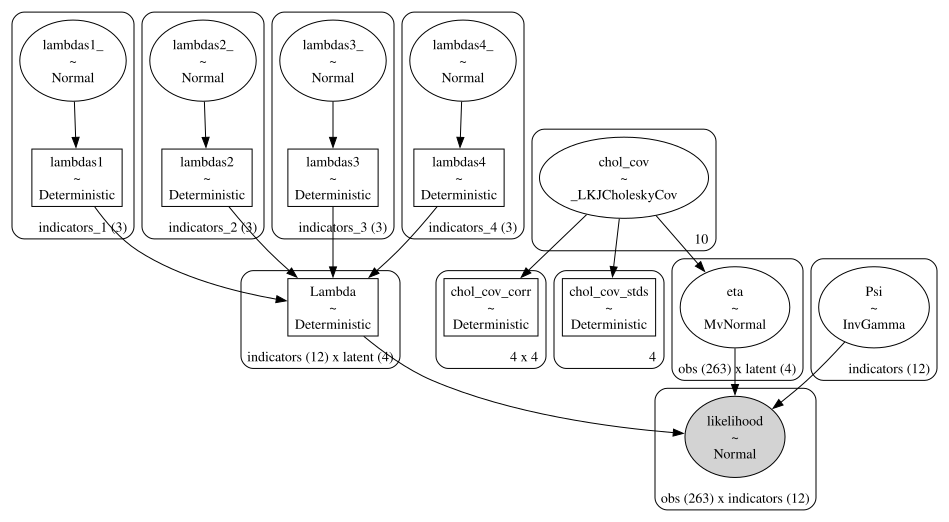

In [6]:
with pm.Model(coords=coords) as cfa_model_v1:

    # --- Factor loadings ---
    lambdas_1 = make_lambda("indicators_1", "lambdas1", priors=[1, 0.5])
    lambdas_2 = make_lambda("indicators_2", "lambdas2", priors=[1, 0.5])
    lambdas_3 = make_lambda("indicators_3", "lambdas3", priors=[1, 0.5])
    lambdas_4 = make_lambda("indicators_4", "lambdas4", priors=[1, 0.5])

    Lambda = make_Lambda(lambdas_1, lambdas_2, lambdas_3, lambdas_4)

    sd_dist = pm.Exponential.dist(1.0, shape=4)
    chol, _, _ = pm.LKJCholeskyCov("chol_cov", n=4, eta=2, sd_dist=sd_dist, compute_corr=True)
    eta = pm.MvNormal("eta", 0, chol=chol, dims=("obs", "latent"))

    # Construct Pseudo Observation matrix based on Factor Loadings
    mu = pt.dot(eta, Lambda.T)  # (n_obs, n_indicators)

    ## Error Terms
    Psi = pm.InverseGamma("Psi", 5, 10, dims="indicators")
    _ = pm.Normal(
        "likelihood", mu=mu, sigma=Psi, observed=observed_data, dims=("obs", "indicators")
    )

pm.model_to_graphviz(cfa_model_v1)

The model diagram should emphasise how the sampling of the latent structure is fed-forward into the ultimate likelihood term. Note here how our likelihood term is specified as a independent Normals. This is a substantive assumption which is later revised. In a full SEM specification we will change the likelihood to use Multivariate normal distribution with specific covariance structures. 

In [7]:
idata_cfa_model_v1 = sample_model(cfa_model_v1, sampler_kwargs=sampler_kwargs)

Sampling: [Psi, chol_cov, eta, lambdas1_, lambdas2_, lambdas3_, lambdas4_, likelihood]
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [lambdas1_, lambdas2_, lambdas3_, lambdas4_, chol_cov, eta, Psi]


Output()

Sampling 4 chains for 2_000 tune and 1_000 draw iterations (8_000 + 4_000 draws total) took 19 seconds.
The rhat statistic is larger than 1.01 for some parameters. This indicates problems during sampling. See https://arxiv.org/abs/1903.08008 for details
The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details
Sampling: [likelihood]


Output()

#### A Sampled Lambda Matrix

Note how each factor records three positive parameters, while the first of each parameters is fixed to 1. This is to ensure that the scale of the latent factor is well defined, indexed as it were to one of the observed metrics.

In [8]:
idata_cfa_model_v1["posterior"]["Lambda"].sel(chain=0, draw=0)

<xarray.DataArray 'Lambda' (indicators: 12, latent: 4)> Size: 384B
array([[1.        , 0.        , 0.        , 0.        ],
       [0.93120262, 0.        , 0.        , 0.        ],
       [0.858999  , 0.        , 0.        , 0.        ],
       [0.        , 1.        , 0.        , 0.        ],
       [0.        , 1.90204887, 0.        , 0.        ],
       [0.        , 1.12337765, 0.        , 0.        ],
       [0.        , 0.        , 1.        , 0.        ],
       [0.        , 0.        , 1.02062537, 0.        ],
       [0.        , 0.        , 1.20889329, 0.        ],
       [0.        , 0.        , 0.        , 1.        ],
       [0.        , 0.        , 0.        , 1.4164532 ],
       [0.        , 0.        , 0.        , 1.97874338]])
Coordinates:
    chain       int64 8B 0
    draw        int64 8B 0
  * latent      (latent) <U13 208B 'satisfaction' ... 'constructive'
  * indicators  (indicators) <U3 144B 'JW1' 'JW2' 'JW3' ... 'EBA' 'ST' 'MI'

### Model Diagnostics and Assessment

For each latent variable (satisfaction, well being, constructive, dysfunctional), we will plot a forest/ridge plot of the posterior distributions of their factor scores `eta` as drawn. Each panel will have a vertical reference line at 0 (since latent scores are typically centered/scaled).These panels visualize the distribution of estimated latent scores across individuals, separated by latent factor. Then we will summarizes posterior estimates of model parameters (factor loadings, regression coefficients, variances, etc.), providing a quick check against identification constraints (like fixed loadings) and effect directions. Finally we will plot the upper-triangle of the residual correlation matrix with a blue–white–red colormap (−1 to +1). This visualizes residual correlations among observed indicators after the SEM structure is accounted for — helping detect model misfit or unexplained associations.

Below these model checks we will plot some diagnostics for the sampler. These plots are aimed at checking whether the sampler has sufficiently explored the parameter space. 

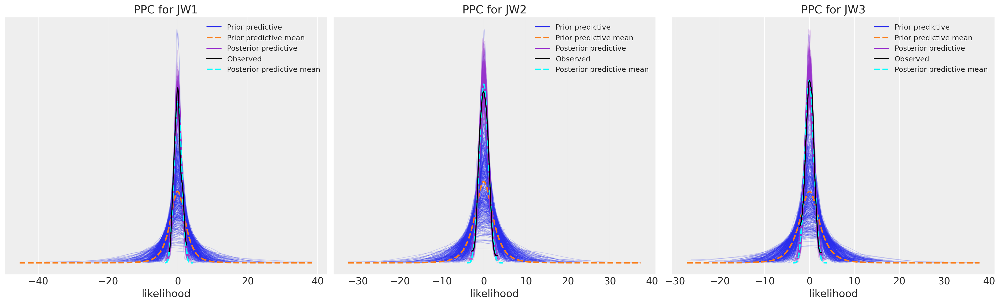

In [9]:
plot_ppc_check(idata_cfa_model_v1, indicators=coords["indicators"][0:3], fitted=True, dims=(1, 3));

In [10]:
def plot_model_highlights(idata, model_name, parameters, sem=False):
    mosaic = """ABCD
                EEEE
                EEEE
                FFFF"""
    axs = plt.subplot_mosaic(mosaic, figsize=(20, 25))
    axs = axs[1]
    latents = ["satisfaction", "well being", "dysfunctional", "constructive"]

    az.plot_forest(
        idata,
        var_names=["eta"],
        coords={"latent": ["satisfaction"]},
        combined=True,
        ax=axs["A"],
        ridgeplot_alpha=0.5,
        colors="deepskyblue",
    )
    az.plot_forest(
        idata,
        var_names=["eta"],
        coords={"latent": ["well being"]},
        combined=True,
        ax=axs["B"],
        colors="gold",
        ridgeplot_alpha=0.5,
    )
    az.plot_forest(
        idata,
        var_names=["eta"],
        coords={"latent": ["constructive"]},
        combined=True,
        ax=axs["C"],
        colors="lightcoral",
        ridgeplot_alpha=0.5,
    )
    az.plot_forest(
        idata,
        var_names=["eta"],
        coords={"latent": ["dysfunctional"]},
        combined=True,
        ax=axs["D"],
        colors="slateblue",
        ridgeplot_alpha=0.5,
    )
    axs["A"].set_title("Satisfaction")
    axs["B"].set_title("Well Being")
    axs["C"].set_title("Constructive")
    axs["D"].set_title("Dysfunctional")
    axs["A"].axvline(0, color="k")
    axs["B"].axvline(0, color="k")
    axs["C"].axvline(0, color="k")
    axs["D"].axvline(0, color="k")
    axs["A"].set_yticklabels([])
    axs["B"].set_yticklabels([])
    axs["C"].set_yticklabels([])
    axs["D"].set_yticklabels([])
    az.plot_forest(idata, var_names=parameters, combined=True, ax=axs["E"])
    axs["E"].set_title(f"Parameter Estimates for {model_name}")
    axs["E"].axvline(1, color="k", linestyle="--")
    if sem:
        axs["E"].axvline(0, color="k")

    residuals_posterior_corr = get_posterior_resids(idata, 2500, metric="corr")
    mask = np.triu(np.ones_like(residuals_posterior_corr, dtype=bool))
    sns.heatmap(
        residuals_posterior_corr,
        annot=True,
        cmap="bwr",
        mask=mask,
        ax=axs["F"],
        vmin=-1,
        vmax=1,
        cbar=False,
    )
    axs["F"].set_title(f"Residuals for {model_name}")
    plt.suptitle("Latent Scores, Parameters Estimates \n and Performance Measures", fontsize=20)
    fig = plt.gcf()
    return fig

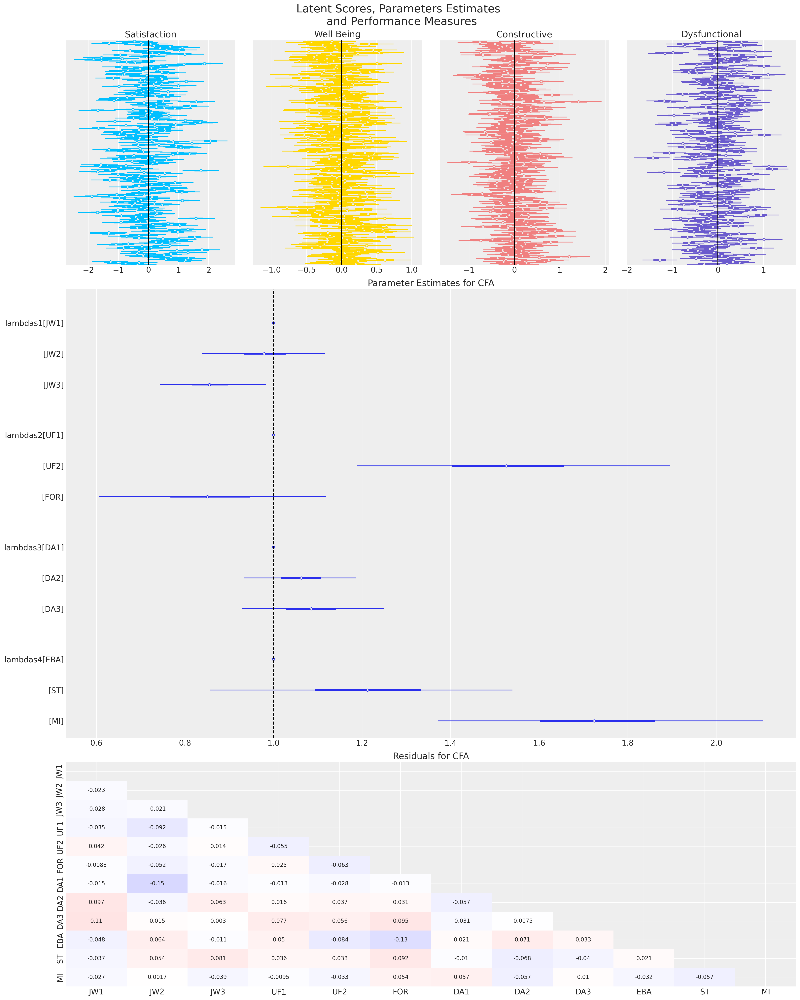

In [11]:
model_name = "CFA"
parameters = ["lambdas1", "lambdas2", "lambdas3", "lambdas4"]

plot_model_highlights(idata_cfa_model_v1, "CFA", parameters);

These plots indicate a fairly promising modelling strategy. The estimated factor Loadings are all close to 1 which implies a conformity in the magnitude and scale of the indicator metrics within each of the four factors.The indicator(s) are strongly reflective of the latent factor although `UF1` and `FOR` seem to be moving in opposite directions. We will want to address this later when we specify covariance structures for the residuals. 

The Posterior Predictive Residuals are close to 0 which suggests that model is well able to capture the latent covariance structure of the observed data. The latent factors move together in intuitive ways, with high Satisfaction ~~ high Well Being. 

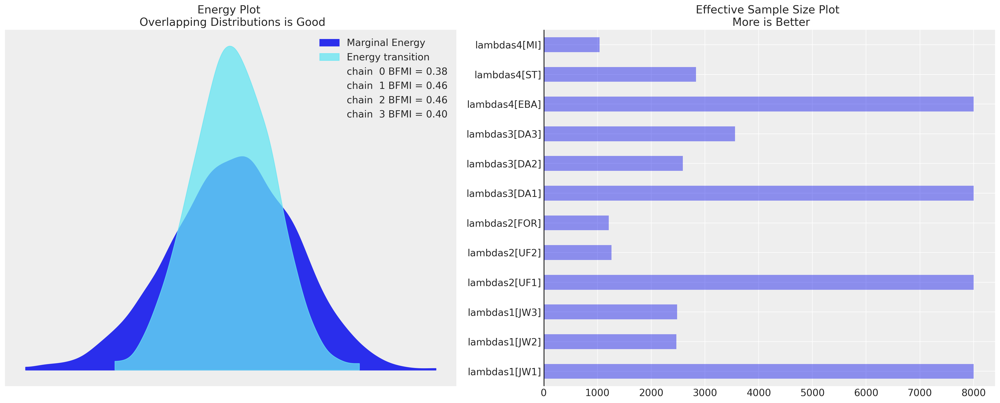

In [12]:
plot_diagnostics(idata_cfa_model_v1, parameters);

The sampler diagnostics give no indication of trouble. This is a promising start. 

## Structuring the Latent Relations

The next expansionary move in SEM modelling is to consider the relations between the latent constructs. These are generally intended to have a causal interpretation. The constructs are hard to measure precisely, but collectively as a function of multiple indicator variables, we argue they are exhaustively characterised. 

> As I have just explained, we cannot isolate a dependent variable from all influences but a single explanatory variable, so it is impossible to make definitive statements about causes. We replace perfect isolation with pseudo-isolation by assuming that the disturbance (i.e., the composite of all omitted determinants) is uncorrelated with the exogenous variables of an equation. - Bollen in _Structural Equations with Latent Variables_ pg45

This is a claim of conditional independence which licenses the causal interpretation of the the arrows in the below plot. The fact that the latent relations operate a higher level of abstraction makes it easier to postulate these "clean" direct paths between constructs. The model makes an argument - to have proprely measured the latent constructs, and isolated their variation - to support the causal claim. Criticisms of the model proceed by assessing how compelling these postulates are in the context of the fitted model.

![](sem3_excalidraw.png)

The isolation or conditional independence of interest is encoded in the model with the sampling of the `gamma` variable. These are drawn from a process that is structuraly divorced from the influence of the exogenous variables. For instance if we have $\gamma_{cts} \perp\!\!\!\perp \eta_{dtp}$ then the $\beta_{cts -> dpt}$ coefficient is an unbiased estimate of the direct effect of `CTS` on `DTP` because the remaining variation in $\eta_{dtp}$ is noise by construction. 

It is entirely optional how many arrows you want to add to your system. In our case we have structured the DAG following the discussion in {cite:p}`vehkalahti2019multivariate` which will allow us to unpick the direct and indirect effects below. 

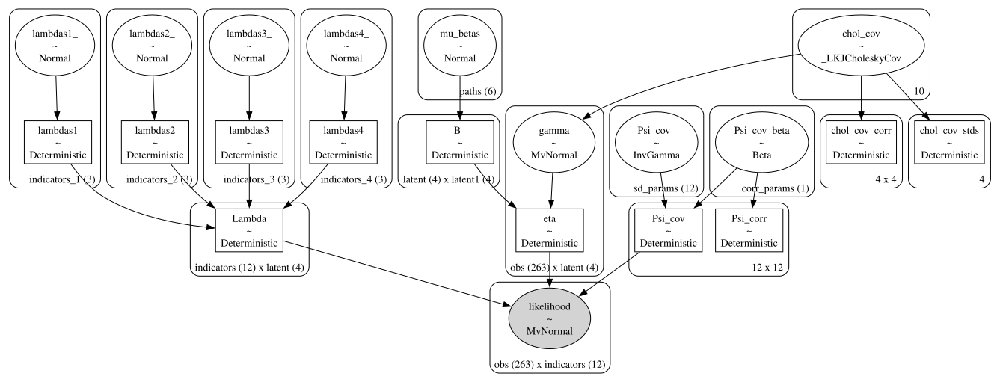

In [13]:
with pm.Model(coords=coords) as sem_model_v1:

    # --- Factor loadings ---
    lambdas_1 = make_lambda("indicators_1", "lambdas1", priors=[1, 0.5])
    lambdas_2 = make_lambda("indicators_2", "lambdas2", priors=[1, 0.5])
    lambdas_3 = make_lambda("indicators_3", "lambdas3", priors=[1, 0.5])
    lambdas_4 = make_lambda("indicators_4", "lambdas4", priors=[1, 0.5])

    Lambda = make_Lambda(lambdas_1, lambdas_2, lambdas_3, lambdas_4)

    latent_dim = len(coords["latent"])

    sd_dist = pm.Exponential.dist(1.0, shape=latent_dim)
    chol, _, _ = pm.LKJCholeskyCov(
        "chol_cov", n=latent_dim, eta=2, sd_dist=sd_dist, compute_corr=True
    )
    gamma = pm.MvNormal("gamma", 0, chol=chol, dims=("obs", "latent"))

    B = make_B()
    I = pt.eye(latent_dim)
    ## Clean Causal Influence of Shocks
    eta = pm.Deterministic(
        "eta", pt.slinalg.solve(I - B + 1e-8 * I, gamma.T).T, dims=("obs", "latent")
    )
    ## Influence of Exogenous indicator variables
    mu = pt.dot(eta, Lambda.T)

    ## Error Terms
    Psi = make_Psi("indicators")
    _ = pm.MvNormal(
        "likelihood", mu=mu, cov=Psi, observed=observed_data, dims=("obs", "indicators")
    )

pm.model_to_graphviz(sem_model_v1)

We have also added the covariance structure on the residuals by supplying a multivariate normal likelihood with a precise covariance structure to add a correlation among the `UF1` and `FOR` indicators metrics. 

In [14]:
idata_sem_model_v1 = sample_model(sem_model_v1, sampler_kwargs)

Sampling: [Psi_cov_, Psi_cov_beta, chol_cov, gamma, lambdas1_, lambdas2_, lambdas3_, lambdas4_, likelihood, mu_betas]
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [lambdas1_, lambdas2_, lambdas3_, lambdas4_, chol_cov, gamma, mu_betas, Psi_cov_, Psi_cov_beta]


Output()

Sampling 4 chains for 2_000 tune and 1_000 draw iterations (8_000 + 4_000 draws total) took 146 seconds.
There were 224 divergences after tuning. Increase `target_accept` or reparameterize.
The rhat statistic is larger than 1.01 for some parameters. This indicates problems during sampling. See https://arxiv.org/abs/1903.08008 for details
The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details
Sampling: [likelihood]


Output()

#### A Sampled B Matrix

Now we can sample the B matrix and observe is structure. It's best to see the matrix as encoding target variables in the columns and predictor variables inn the rows. Here we have the set up our matrix so that `satisfaction` is predicted by three variables, but not itself. The values in the first column are sampled coefficient values in the regression: 

$$ \eta_{sat} \sim B_{1, 0}\eta_{well} + B_{2, 0}\eta_{dys} +  B_{3, 0}\eta_{con}$$

where we've used pythonic indexing of the matrix. Note how values of $\eta$ appear on both sides of the equation. We are solving a system of equations simultaneously i.e. we need to solve for $\eta = B\eta $ where values of $\eta_{i}$ appear on both sides. Solving the matrix untangles the mess of simultaneous equations, but also allows us to derive to total, direct and indirect effects of each latent factor across all the pathways of the system. 


In [15]:
idata_sem_model_v1["posterior"]["B_"].sel(chain=0, draw=0)

<xarray.DataArray 'B_' (latent: 4, latent1: 4)> Size: 128B
array([[ 0.        ,  0.        ,  0.        ,  0.        ],
       [ 0.21193114,  0.        ,  0.        ,  0.        ],
       [-0.529831  ,  0.53995101,  0.        ,  0.        ],
       [-0.05907599, -0.33859106, -0.1234677 ,  0.        ]])
Coordinates:
    chain    int64 8B 0
    draw     int64 8B 0
  * latent   (latent) <U13 208B 'satisfaction' 'well being' ... 'constructive'
  * latent1  (latent1) <U13 208B 'satisfaction' 'well being' ... 'constructive'

This compact representation of three separate regressions equations is used to artificially sort out the mutual influences, interactions and distortion our habits have on our job satisfaction. The relationships between these latent constructs need not be simplistic just because we are using a regresssion framework. There may be messy non-linear relationships between satisfaction and well being, but we are a deliberately abstracting some of that away in favour of a tractable, quantifiable measure of effect.  

### Model Diagnostics and Assessment

The posterior predictive distributions retain a healthy appearence, the prior allowed for a wide-realisation of values and the posterior has a shrunk the range considerable closer to the standardised 0-mean data. 

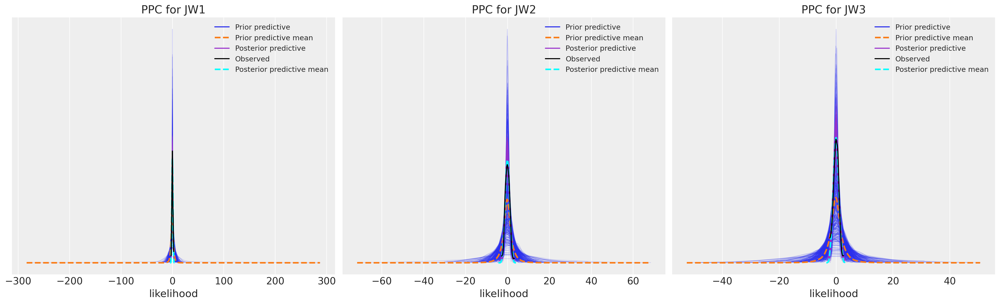

In [16]:
plot_ppc_check(idata_sem_model_v1, indicators=coords["indicators"][0:3], fitted=True, dims=(1, 3));

The modelling shows improvement on the model implied residuals. Additionally we now get insight into the implied paths and relationships between the latent constructs. These move in compelling ways. Dysfunctional thought processes have a probable negative impact on well being, and similarly for job satisfaction. Conversely constructive thought processes have a probable positive direct effect on well being and satisfaction. Although the latter appears slight. 

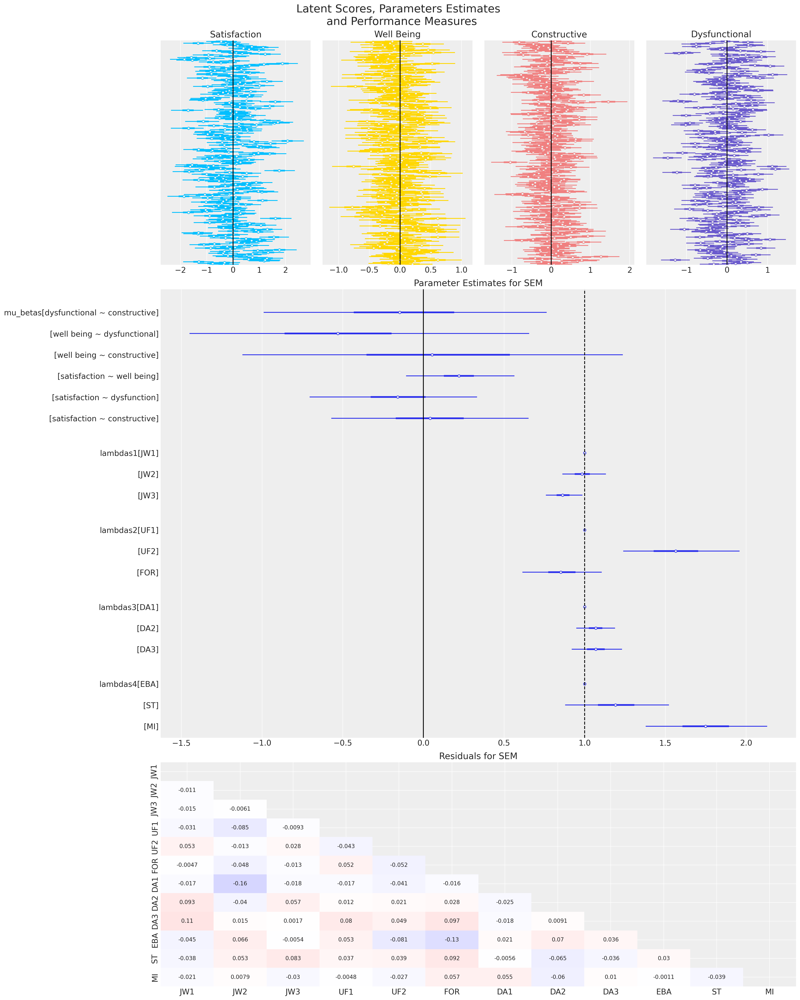

In [17]:
parameters = ["mu_betas", "lambdas1", "lambdas2", "lambdas3", "lambdas4"]
plot_model_highlights(idata_sem_model_v1, "SEM", parameters, sem=True);

However, the model diagnostics appear less robust. The sampler seemed to have difficulty with sampling the parameters for the path-coefficients `mu_betas`. 

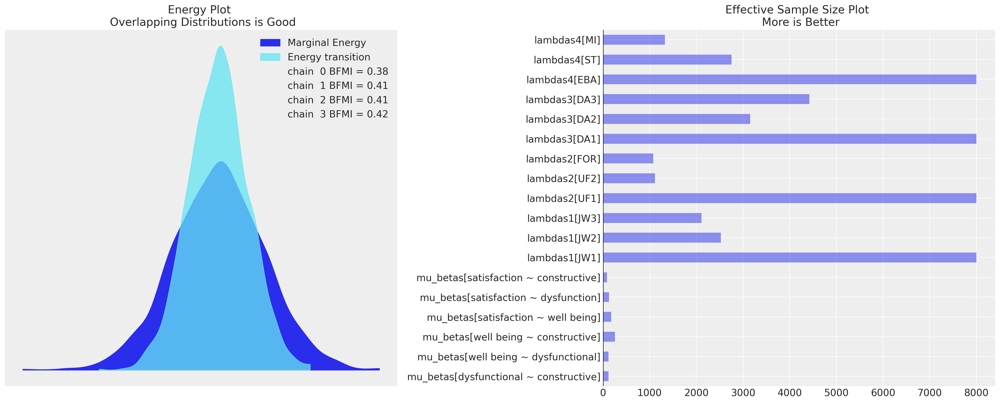

In [18]:
plot_diagnostics(idata_sem_model_v1, parameters);

The sampler diagnostics suggest that the model is having trouble samplng from the B matrix. This is a little concern because arguably the structural relations are the primary parameters of interest in the SEM setting. Anything which undercuts our confidence in their estimation, undermines the whole modelling exercise.

## Marginal Formulation of the Likelihood

In the nex model we focus on the covariance matrix implied by the model rather than conditional regressions. We still use the B matrix, but the role it plays differs slightly. This approach cuts down on the burden for the sampler, by remove the need to parameterise $\eta$ directly. Instead B is used to generate the system's covariance structure and regression like effects are derived as a result. 


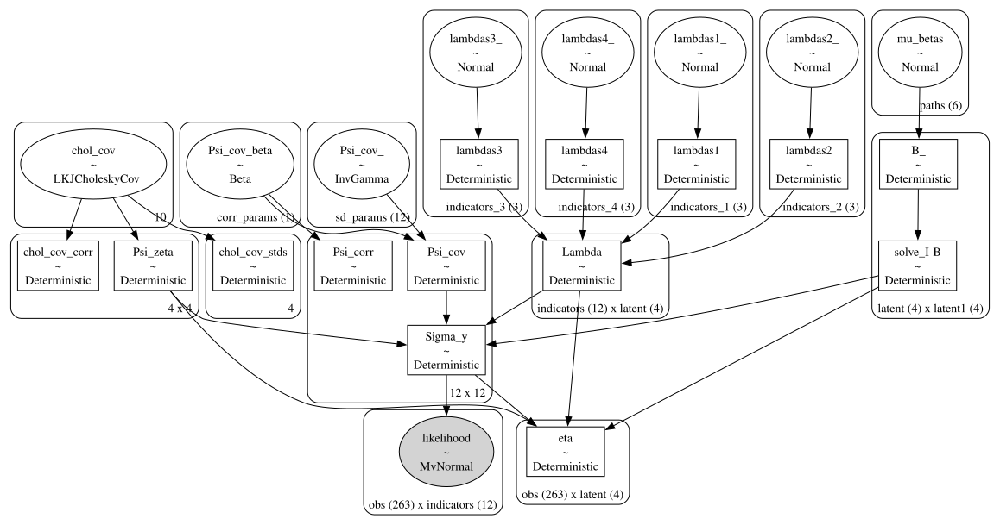

In [19]:
with pm.Model(coords=coords) as sem_model_v2:

    # --- Factor loadings ---
    lambdas_1 = make_lambda("indicators_1", "lambdas1", priors=[1, 0.5])
    lambdas_2 = make_lambda("indicators_2", "lambdas2", priors=[1, 0.5])
    lambdas_3 = make_lambda("indicators_3", "lambdas3", priors=[1, 0.5])
    lambdas_4 = make_lambda("indicators_4", "lambdas4", priors=[1, 0.5])

    Lambda = make_Lambda(lambdas_1, lambdas_2, lambdas_3, lambdas_4)

    sd_dist = pm.Exponential.dist(1.0, shape=4)
    chol, _, _ = pm.LKJCholeskyCov("chol_cov", n=4, eta=2, sd_dist=sd_dist, compute_corr=True)

    Psi_zeta = pm.Deterministic("Psi_zeta", chol.dot(chol.T))
    Psi = make_Psi("indicators")

    B = make_B()
    latent_dim = len(coords["latent"])
    I = pt.eye(latent_dim)
    lhs = I - B + 1e-8 * pt.eye(latent_dim)  # (latent_dim, latent_dim)
    inv_lhs = pm.Deterministic(
        "solve_I-B", pt.slinalg.solve(lhs, pt.eye(latent_dim)), dims=("latent", "latent1")
    )

    Sigma_y = pm.Deterministic(
        "Sigma_y",
        Lambda.dot(inv_lhs).dot(Psi_zeta).dot(inv_lhs.T).dot(Lambda.T) + Psi,
    )
    ## Eta is predicted not sampled!
    M = Psi_zeta @ inv_lhs @ Lambda.T @ pm.math.matrix_inverse(Sigma_y)
    eta_hat = pm.Deterministic("eta", (M @ (observed_data - 0).T).T, dims=("obs", "latent"))
    _ = pm.MvNormal(
        "likelihood", mu=0, cov=Sigma_y, observed=observed_data, dims=("obs", "indicators")
    )

pm.model_to_graphviz(sem_model_v2)

In [20]:
idata_sem_model_v2 = sample_model(sem_model_v2, sampler_kwargs)

Sampling: [Psi_cov_, Psi_cov_beta, chol_cov, lambdas1_, lambdas2_, lambdas3_, lambdas4_, likelihood, mu_betas]
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [lambdas1_, lambdas2_, lambdas3_, lambdas4_, chol_cov, Psi_cov_, Psi_cov_beta, mu_betas]


Output()

Sampling 4 chains for 2_000 tune and 1_000 draw iterations (8_000 + 4_000 draws total) took 88 seconds.
There were 2 divergences after tuning. Increase `target_accept` or reparameterize.
Sampling: [likelihood]


Output()

### Model Diagnostics and Assessment

Note here how the prior range supasses the previous posterior predictive checks. The model is exploring a much wider potential outcome space, but still neatly resolves to a 0-mean system after updating the posterior.

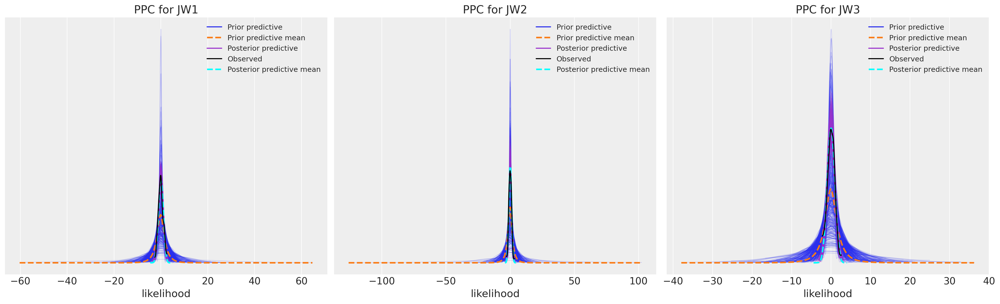

In [21]:
plot_ppc_check(idata_sem_model_v2, indicators=coords["indicators"][0:3], fitted=True, dims=(1, 3));

The parameter estimates and other model health metrics seem in line with the covariance structure observed in the confirmatory factor model which suggests that even with our extra parameterisation we retain fidelty to the data generating process. 

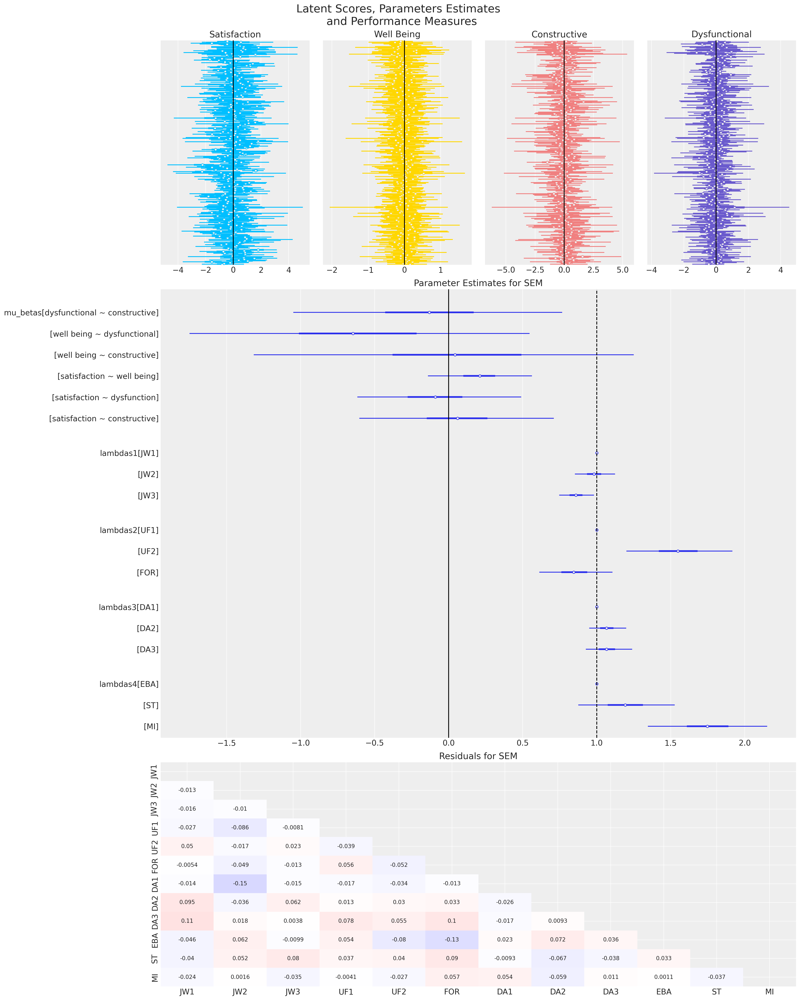

In [22]:
parameters = ["mu_betas", "lambdas1", "lambdas2", "lambdas3", "lambdas4"]
plot_model_highlights(idata_sem_model_v2, "SEM", parameters, sem=True);

However, now the sampler health looks much, much better. Marginalising the likelihood seems to have considerable improved the sampling diagnostics. 

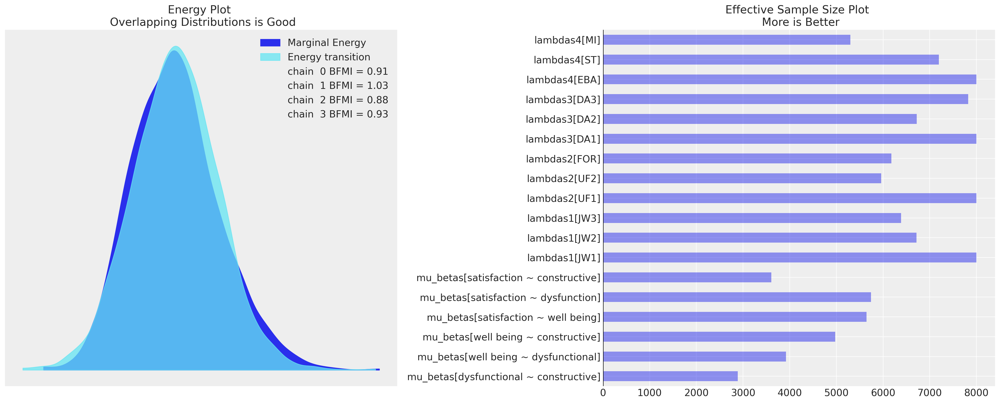

In [23]:
plot_diagnostics(idata_sem_model_v2, parameters);

## Mean Structure SEM

Let's add a bit more structure and push this sampling strategy. Here we've allowed the the mean realisation of the the indicator variables can vary. The $\mu$ parameter of our likelihood needs to reflect this assumption to better capture the structure of the data. This is useful when believe there are baseline differences across groups in the data or you want to compare the mean-differences across two populations.

In [24]:
sample_df_mean = make_sample(cov_matrix, 263, FEATURE_COLUMNS, mean_structure=True)
pd.DataFrame(sample_df_mean.mean()).T

,JW1,JW2,JW3,UF1,UF2,FOR,DA1,DA2,DA3,EBA,ST,MI
0,-1.817569,3.366101,-0.876908,1.428081,0.768598,0.673687,2.083799,4.46547,0.411921,6.649517,0.397408,1.921129


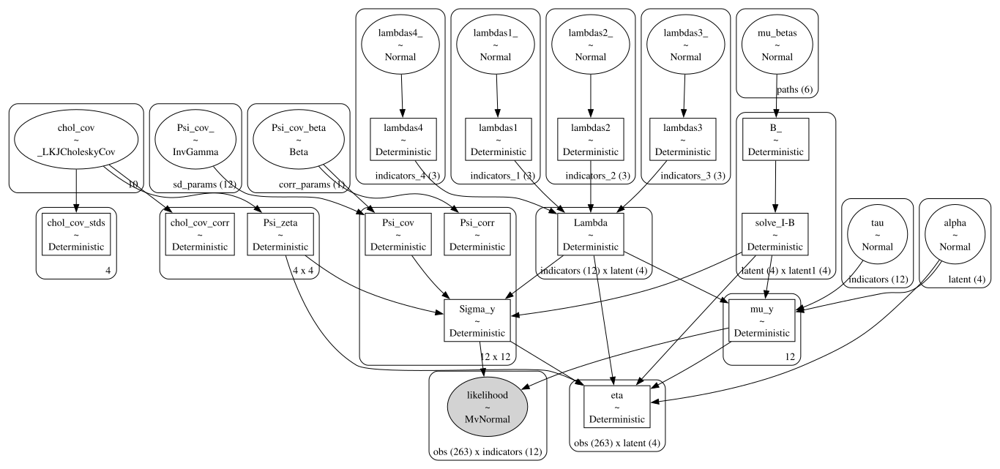

In [25]:
obs_idx = list(range(len(sample_df_mean)))
observed_data = sample_df_mean[coords["indicators"]].values
coords["obs"] = range(len(sample_df_mean))

with pm.Model(coords=coords) as sem_model_mean_structure:

    # --- Factor loadings ---
    lambdas_1 = make_lambda("indicators_1", "lambdas1", priors=[1, 0.5])
    lambdas_2 = make_lambda("indicators_2", "lambdas2", priors=[1, 0.5])
    lambdas_3 = make_lambda("indicators_3", "lambdas3", priors=[1, 0.5])
    lambdas_4 = make_lambda("indicators_4", "lambdas4", priors=[1, 0.5])
    Lambda = make_Lambda(lambdas_1, lambdas_2, lambdas_3, lambdas_4)

    sd_dist = pm.Exponential.dist(1.0, shape=4)
    chol, _, _ = pm.LKJCholeskyCov("chol_cov", n=4, eta=2, sd_dist=sd_dist, compute_corr=True)

    Psi_zeta = pm.Deterministic("Psi_zeta", chol.dot(chol.T))
    Psi = make_Psi("indicators")

    B = make_B()
    latent_dim = len(coords["latent"])
    I = pt.eye(latent_dim)
    lhs = I - B + 1e-8 * pt.eye(latent_dim)  # (latent_dim, latent_dim)
    inv_lhs = pm.Deterministic(
        "solve_I-B", pt.slinalg.solve(lhs, pt.eye(latent_dim)), dims=("latent", "latent1")
    )

    # Mean Structure
    tau = pm.Normal("tau", mu=0, sigma=5, dims="indicators")  # observed intercepts
    alpha = pm.Normal("alpha", mu=0, sigma=0.5, dims="latent")  # latent means
    mu_y = pm.Deterministic("mu_y", tau + pt.dot(Lambda, pt.dot(inv_lhs, alpha)))

    Sigma_y = pm.Deterministic(
        "Sigma_y", Lambda.dot(inv_lhs).dot(Psi_zeta).dot(inv_lhs.T).dot(Lambda.T) + Psi
    )
    M = Psi_zeta @ inv_lhs @ Lambda.T @ pm.math.matrix_inverse(Sigma_y)
    eta_hat = pm.Deterministic(
        "eta", alpha + (M @ (observed_data - mu_y).T).T, dims=("obs", "latent")
    )
    _ = pm.MvNormal(
        "likelihood", mu=mu_y, cov=Sigma_y, observed=observed_data, dims=("obs", "indicators")
    )

pm.model_to_graphviz(sem_model_mean_structure)

In [26]:
sampler_kwargs = {"tune": 2000, "draws": 1000, "nuts_sampler": "numpyro"}
idata_sem_model_v3 = sample_model(sem_model_mean_structure, sampler_kwargs)

Sampling: [Psi_cov_, Psi_cov_beta, alpha, chol_cov, lambdas1_, lambdas2_, lambdas3_, lambdas4_, likelihood, mu_betas, tau]


  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

Sampling: [likelihood]


Output()

### Model Diagnostics and Assessment

We can now see how the prior draws vary more explicitly around 0 seeking the mean realisation of each outcome variable. We've asked the model to learn "more" structure and it naturally explores more of the parameter space to evaluate comparable likelihoods. 

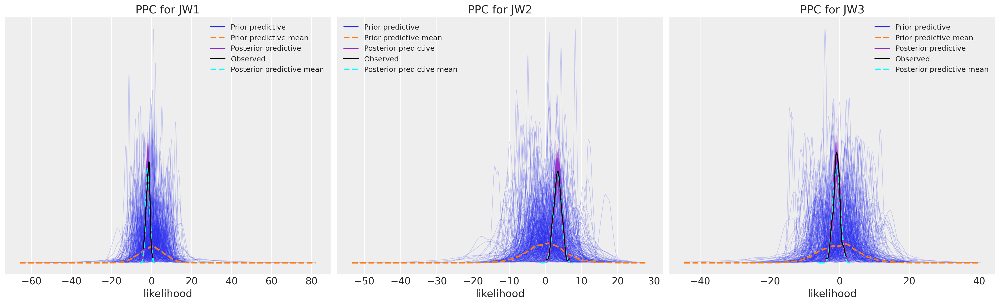

In [27]:
plot_ppc_check(idata_sem_model_v3, indicators=coords["indicators"][0:3], fitted=True, dims=(1, 3));

We can now assess the `tau` parameters to see where the model locates the mean realisation of each indicator variable. 

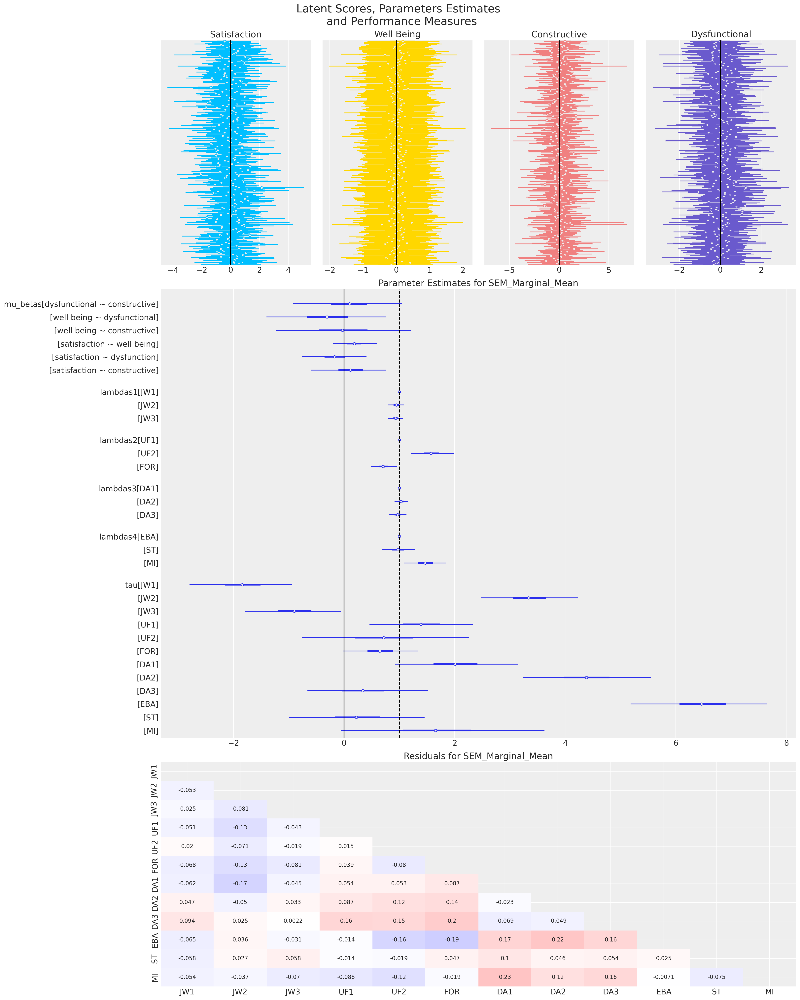

In [28]:
parameters = ["mu_betas", "lambdas1", "lambdas2", "lambdas3", "lambdas4", "tau"]
plot_model_highlights(idata_sem_model_v3, "SEM_Marginal_Mean", parameters, sem=True);

The posterior predictive distribution of the model implied residuals seems comparable to the cases above, but this time we've also isolated the mean structure. 

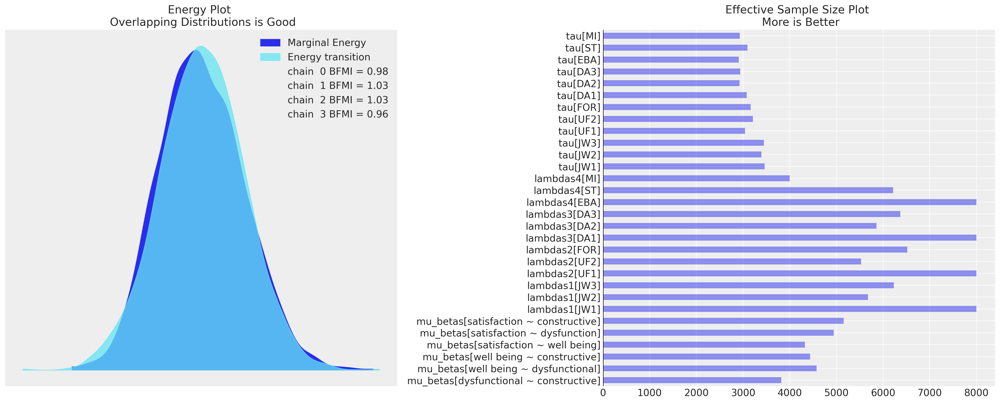

In [29]:
plot_diagnostics(idata_sem_model_v3, parameters);

The sampler diagnostics also seem healthy. 

## Comparing Models

Just for clarity, we'll pull together the residual plots. 

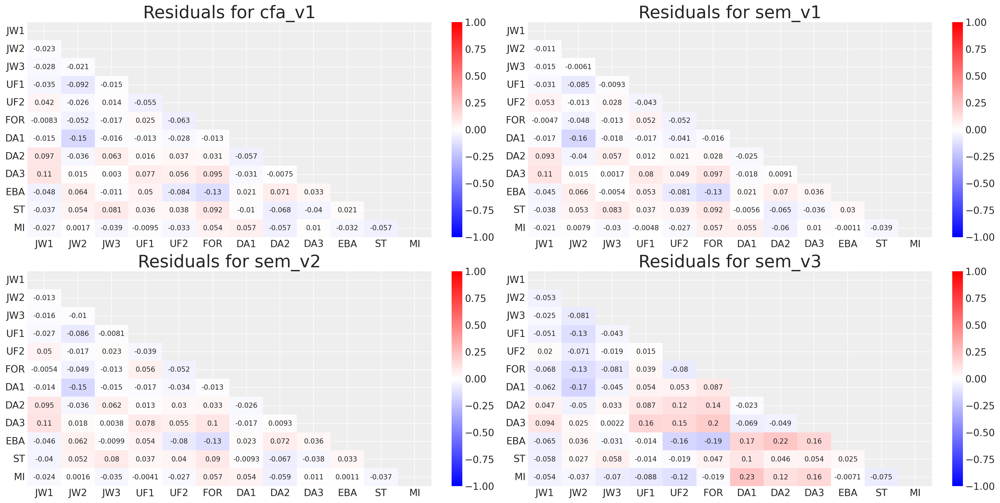

In [30]:
import seaborn as sns

idatas = [idata_cfa_model_v1, idata_sem_model_v1, idata_sem_model_v2, idata_sem_model_v3]
model_names = ["cfa_v1", "sem_v1", "sem_v2", "sem_v3"]


fig, axs = plt.subplots(2, 2, figsize=(20, 10))
axs = axs.flatten()
for idata, model_name, ax in zip(idatas, model_names, axs):
    residuals_posterior_corr = get_posterior_resids(idata, 2500, metric="corr")
    mask = np.triu(np.ones_like(residuals_posterior_corr, dtype=bool))
    sns.heatmap(residuals_posterior_corr, annot=True, cmap="bwr", mask=mask, ax=ax, vmin=-1, vmax=1)
    ax.set_title(f"Residuals for {model_name}", fontsize=25);

and align the parameter estimates. Here we can see that the models are substantially similar in key dimensions; the magnitude and direction of the implied effects are similar across each model. This is an important observation. It is this kind of robustness to model specification that we want to see in this kind of iterative modelling. This should give us confidence that the model is well specified and picking up on the actual relationships between these latent constructs. 

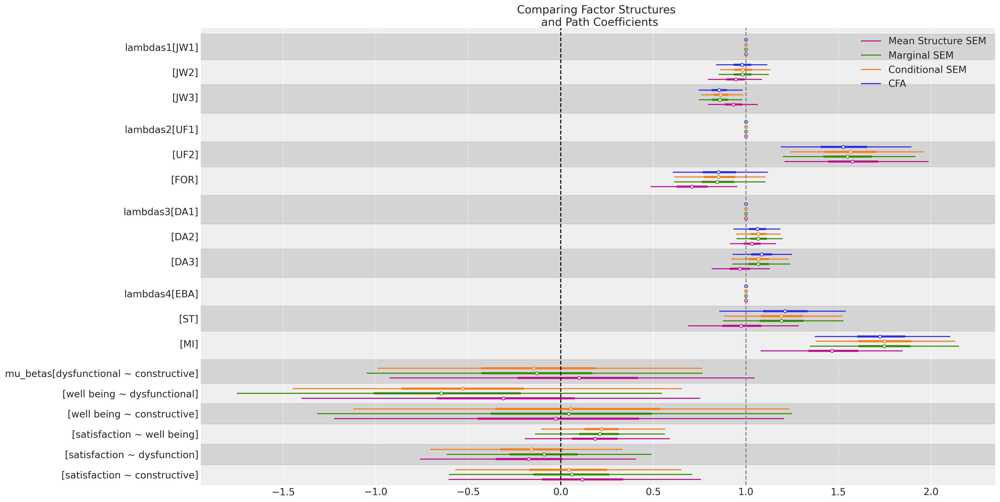

In [31]:
ax = az.plot_forest(
    [idata_cfa_model_v1, idata_sem_model_v1, idata_sem_model_v2, idata_sem_model_v3],
    model_names=["CFA", "Conditional SEM", "Marginal SEM", "Mean Structure SEM"],
    var_names=["lambdas1", "lambdas2", "lambdas3", "lambdas4", "mu_betas"],
    combined=True,
    figsize=(20, 10),
)

ax[0].axvline(0, linestyle="--", color="k")
ax[0].axvline(1, linestyle="--", color="grey")
ax[0].set_title("Comparing Factor Structures \n and Path Coefficients");

But sensitivity analysis is one approach, we can be even more clinical in our assessment of these models. We can perform parameter recovery exercises to properly validate that our model specification can identify the structural parameters of our complex SEM architecture. 

## Hierarchical Model on Structural Components

The mean-structure model above offers us an interesting way to implement hierarchical Bayesian SEMs. We can simply add a hierarchical component to the `tau` parameter and aim to infer how the baseline expectation for each indicator variable, shifts across groups. However, a more interesting and complex route is to assess if hierarchical structure holds across the `B` matrix estimates. Or putting it another way - can we determine if the relationships between these latent factors have a different causal structure as we vary the group of interest. 

![](hierarchical_excalidraw.png)

Let's assume we are aiming to assess a causal difference between treatment and control groups.

In [32]:
grp_idx = np.random.binomial(1, 0.5, 250)
coords["group"] = ["treatment", "control"]
coords["obs"] = list(range(len(grp_idx)))
coords.keys()

dict_keys(['obs', 'indicators', 'indicators_1', 'indicators_2', 'indicators_3', 'indicators_4', 'latent', 'latent1', 'paths', 'sd_params', 'corr_params', 'group'])

We're now going to add hierarchical structure to the `B` coefficients and feed these through the likelihood term to infer how the structural coefficients respond to group differences. 

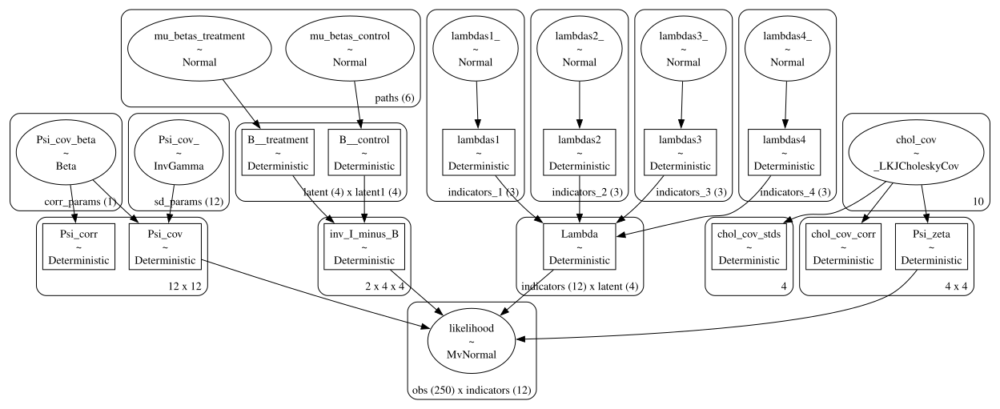

In [33]:
def make_hierarchical(priors, grp_idx):
    with pm.Model(coords=coords) as sem_model_hierarchical:

        # --- Factor loadings ---
        lambdas_1 = make_lambda("indicators_1", "lambdas1", priors=priors["lambdas"])
        lambdas_2 = make_lambda("indicators_2", "lambdas2", priors=priors["lambdas"])
        lambdas_3 = make_lambda("indicators_3", "lambdas3", priors=priors["lambdas"])
        lambdas_4 = make_lambda("indicators_4", "lambdas4", priors=priors["lambdas"])

        Lambda = make_Lambda(lambdas_1, lambdas_2, lambdas_3, lambdas_4)

        sd_dist = pm.Exponential.dist(1.0, shape=4)
        chol, _, _ = pm.LKJCholeskyCov("chol_cov", n=4, eta=2, sd_dist=sd_dist, compute_corr=True)

        Psi_zeta = pm.Deterministic("Psi_zeta", chol.dot(chol.T))
        Psi = make_Psi("indicators")

        Bs = []
        for g in coords["group"]:
            B_g = make_B(group_suffix=f"_{g}", priors=priors["B"])  # give group-specific names
            Bs.append(B_g)
        B_ = pt.stack(Bs)

        latent_dim = len(coords["latent"])
        I = pt.eye(latent_dim)

        # invert (I - B_g) for each group
        inv_I_minus_B = pm.Deterministic(
            "inv_I_minus_B",
            pt.stack(
                [pt.slinalg.solve(I - B_[g] + 1e-8 * I, I) for g in range(len(coords["group"]))]
            ),
        )

        Sigma_y = []
        for g in range(len(coords["group"])):
            inv_lhs = inv_I_minus_B[g]
            Sigma_y_g = Lambda @ inv_lhs @ Psi_zeta @ inv_lhs.T @ Lambda.T + Psi
            Sigma_y.append(Sigma_y_g)
        Sigma_y = pt.stack(Sigma_y)
        _ = pm.MvNormal("likelihood", mu=0, cov=Sigma_y[grp_idx], dims=("obs", "indicators"))

    return sem_model_hierarchical


priors = {"lambdas": [1, 0.5], "eta": 2, "B": [0, 0.5], "tau": [0, 1]}

priors_wide = {"lambdas": [1, 5], "eta": 2, "B": [0, 5], "tau": [0, 5]}

sem_model_hierarchical_tight = make_hierarchical(priors, grp_idx)
sem_model_hierarchical_wide = make_hierarchical(priors_wide, grp_idx)

pm.model_to_graphviz(sem_model_hierarchical_tight)

Note how we have not passed through any data into this model. This is deliberate. We want now to simulate data from the model with forward pass through the system. We have initialised two versions of the model: (1) with wide parameters and (2) with tight parameters on the data generating condition. We are going to sample from the tight parameters model to draw out indicator data that conforms with the parameter setting we do now. 

In [34]:
# Generating data from model by fixing parameters
fixed_parameters = {
    "mu_betas_treatment": [0.1, 0.5, 2.3, 0.9, -2.0, 0.8],
    "mu_betas_control": [3, 0.2, 0.7, 0.8, 0.6, 1.2],
    "lambdas1_": [1.0, 0.8, 0.9],
    "lambdas2_": [1.0, 0.9, 1.2],
    "lambdas3_": [1.0, 0.95, 0.8],
    "lambdas4_": [1.0, 1.4, 1.1],
    "chol_cov": [0.696, -0.096, 0.23, -0.3, -0.385, 0.398, -0.004, 0.043, -0.037, 0.422],
    "Psi_cov_": [0.559, 0.603, 0.666, 0.483, 0.53, 0.402, 0.35, 0.28, 0.498, 0.494, 0.976, 0.742],
    "Psi_cov_beta": [0.029],
}
with pm.do(sem_model_hierarchical_tight, fixed_parameters) as synthetic_model:
    idata = pm.sample_prior_predictive(
        random_seed=1000,
    )  # Sample from prior predictive distribution.
    synthetic_y = idata["prior"]["likelihood"].sel(draw=0, chain=0)

Sampling: [likelihood]


This has generated synthetic observations spawned from the SEM system we have just set up.

In [35]:
synthetic_y

<xarray.DataArray 'likelihood' (obs: 250, indicators: 12)> Size: 24kB
array([[ 0.00982885,  0.3897868 , -1.00973946, ..., -1.84638515,
        -3.01495066, -2.16506401],
       [-0.05466158,  0.42126215,  0.55645638, ..., -1.46301717,
        -2.58913314, -2.24816439],
       [ 0.75686281,  0.83828753,  1.18396042, ...,  1.0666318 ,
         0.58314163,  2.5647176 ],
       ...,
       [-0.84153918, -1.53959097,  0.22525716, ..., -2.67860379,
        -4.2969259 , -3.39652356],
       [-0.49950038, -0.16313664,  1.50717475, ...,  2.40360766,
         2.43653168,  2.99573839],
       [ 0.34965096, -0.29284024, -0.17422235, ..., -0.67921607,
         0.44405459, -2.29767092]])
Coordinates:
    chain       int64 8B 0
    draw        int64 8B 0
  * indicators  (indicators) <U3 144B 'JW1' 'JW2' 'JW3' ... 'EBA' 'ST' 'MI'
  * obs         (obs) int64 2kB 0 1 2 3 4 5 6 7 ... 243 244 245 246 247 248 249

We now want to see if we can infer the parameters used to generate the data from the `synthetic_y`. To do so, we use the wide-parameterisation of the model, this is more realistic in that we likely don't know the true range of the priors when we come to real world data.

In [36]:
# Infer parameters conditioned on observed data
with pm.observe(sem_model_hierarchical_wide, {"likelihood": synthetic_y}) as inference_model:
    idata_hierarchical = pm.sample_prior_predictive()
    idata_hierarchical.extend(
        pm.sample(random_seed=100, nuts_sampler="numpyro", chains=4, draws=500)
    )

Sampling: [Psi_cov_, Psi_cov_beta, chol_cov, lambdas1_, lambdas2_, lambdas3_, lambdas4_, likelihood, mu_betas_control, mu_betas_treatment]


  0%|          | 0/1500 [00:00<?, ?it/s]

  0%|          | 0/1500 [00:00<?, ?it/s]

  0%|          | 0/1500 [00:00<?, ?it/s]

  0%|          | 0/1500 [00:00<?, ?it/s]

The rhat statistic is larger than 1.01 for some parameters. This indicates problems during sampling. See https://arxiv.org/abs/1903.08008 for details


The model samples well and gives good evidence of distinct posterior distributions across the parameters suggesting the model is capable of identification. 

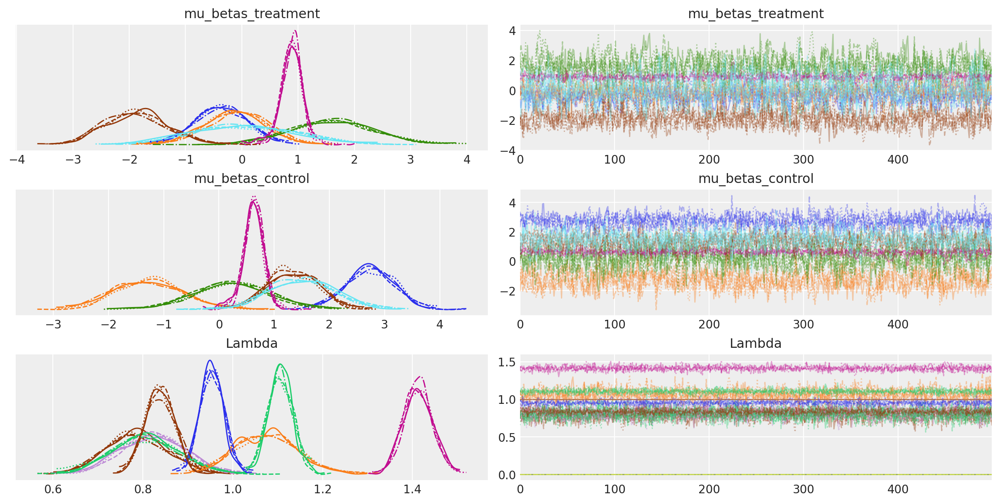

In [37]:
az.plot_trace(idata_hierarchical, var_names=["mu_betas_treatment", "mu_betas_control", "Lambda"]);

#### Parameter Recovery Plots

But we can actually assess the degree of parameter recovery because we know the true values

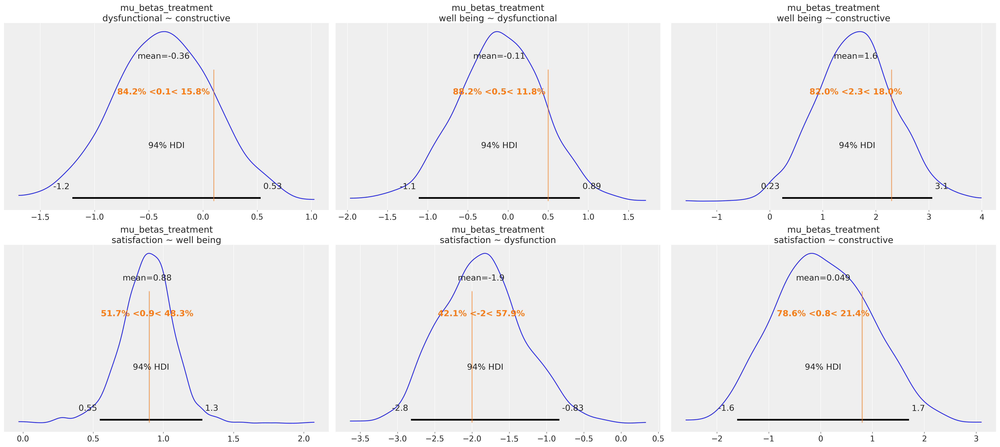

In [38]:
az.plot_posterior(
    idata_hierarchical,
    var_names=["mu_betas_treatment"],
    ref_val=fixed_parameters["mu_betas_treatment"],
);

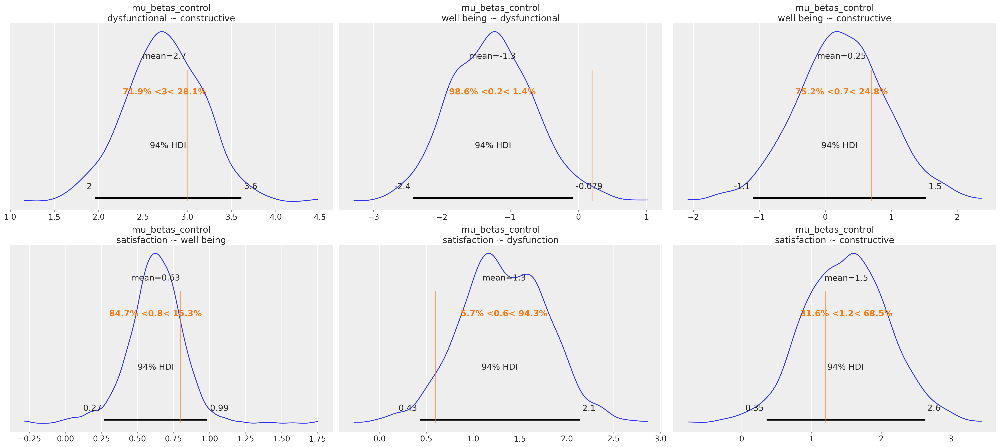

In [39]:
az.plot_posterior(
    idata_hierarchical, var_names=["mu_betas_control"], ref_val=fixed_parameters["mu_betas_control"]
);

## Discrete Choice Component


In [40]:
observed_data_discrete = make_sample(cov_matrix, 250, FEATURE_COLUMNS)
observed_data_discrete = observed_data_discrete.values
coords["obs"] = range(len(observed_data_discrete))
coords["alts"] = ["stay", "quit", "quiet quit"]

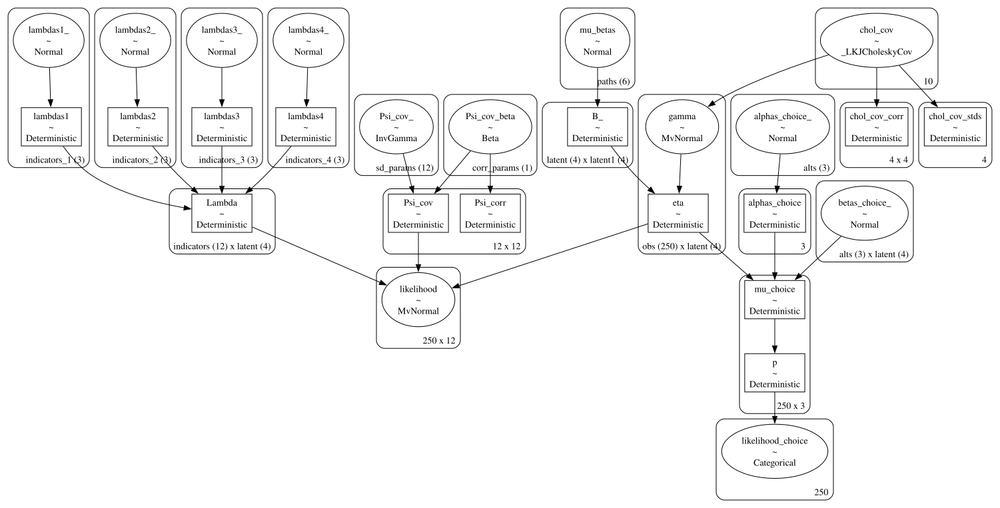

In [41]:
def make_discrete_choice_conditional(observed_data, priors, conditional=True):
    with pm.Model(coords=coords) as sem_model_discrete_choice:

        # --- Factor loadings ---
        lambdas_1 = make_lambda("indicators_1", "lambdas1", priors=priors["lambdas"])
        lambdas_2 = make_lambda("indicators_2", "lambdas2", priors=priors["lambdas"])
        lambdas_3 = make_lambda("indicators_3", "lambdas3", priors=priors["lambdas"])
        lambdas_4 = make_lambda("indicators_4", "lambdas4", priors=priors["lambdas"])

        Lambda = make_Lambda(lambdas_1, lambdas_2, lambdas_3, lambdas_4)

        sd_dist = pm.Exponential.dist(1.0, shape=4)
        chol, _, _ = pm.LKJCholeskyCov(
            "chol_cov", n=4, eta=priors["eta"], sd_dist=sd_dist, compute_corr=True
        )

        Psi = make_Psi("indicators")

        B = make_B()
        if conditional:
            latent_dim = len(coords["latent"])
            gamma = pm.MvNormal("gamma", 0, chol=chol, dims=("obs", "latent"))
            I = pt.eye(latent_dim)
            eta = pm.Deterministic(
                "eta", pt.slinalg.solve(I - B + 1e-8 * I, gamma.T).T, dims=("obs", "latent")
            )
            mu = pt.dot(eta, Lambda.T)
            _ = pm.MvNormal("likelihood", mu=mu, cov=Psi)
        else:
            Psi_zeta = pm.Deterministic("Psi_zeta", chol.dot(chol.T))
            latent_dim = len(coords["latent"])
            I = pt.eye(latent_dim)
            lhs = I - B + 1e-8 * pt.eye(latent_dim)  # (latent_dim, latent_dim)
            inv_lhs = pm.Deterministic(
                "solve_I-B", pt.slinalg.solve(lhs, pt.eye(latent_dim)), dims=("latent", "latent1")
            )

            Sigma_y = pm.Deterministic(
                "Sigma_y",
                Lambda.dot(inv_lhs).dot(Psi_zeta).dot(inv_lhs.T).dot(Lambda.T) + Psi,
            )
            ## Eta is predicted not sampled!
            M = Psi_zeta @ inv_lhs @ Lambda.T @ pm.math.matrix_inverse(Sigma_y)
            eta = pm.Deterministic("eta", (M @ (observed_data - 0).T).T, dims=("obs", "latent"))
            _ = pm.MvNormal("likelihood", mu=0, cov=Sigma_y, dims=("obs", "indicators"))

        alphas_choice_ = pm.Normal(
            "alphas_choice_", priors["alphas_choice"][0], priors["alphas_choice"][1], dims=("alts",)
        )
        alphas_choice = pm.Deterministic("alphas_choice", pt.set_subtensor(alphas_choice_[-1], 0))

        betas_choice_ = pm.Normal(
            "betas_choice_",
            priors["betas_choice"][0],
            priors["betas_choice"][1],
            dims=("alts", "latent"),
        )
        betas_choice = pt.expand_dims(alphas_choice, 1) * betas_choice_

        utility_of_work = pm.Deterministic(
            "mu_choice", alphas_choice + pm.math.dot(eta, betas_choice.T)
        )
        p = pm.Deterministic("p", pm.math.softmax(utility_of_work, axis=1))
        _ = pm.Categorical("likelihood_choice", p)

    return sem_model_discrete_choice


priors = {
    "lambdas": [1, 0.5],
    "eta": 2,
    "B": [0, 0.5],
    "betas_choice": [0, 1],
    "alphas_choice": [0, 1],
}

priors_wide = {
    "lambdas": [1, 5],
    "eta": 2,
    "B": [0, 5],
    "betas_choice": [0, 5],
    "alphas_choice": [0, 5],
}

sem_model_discrete_choice_tight = make_discrete_choice_conditional(
    observed_data_discrete, priors, conditional=True
)
sem_model_discrete_choice_wide = make_discrete_choice_conditional(
    synthetic_y.values, priors_wide, conditional=True
)

pm.model_to_graphviz(sem_model_discrete_choice_tight)

In [42]:
fixed_parameters = {
    "lambdas1_": [1, 0.8, 0.9],
    "lambdas2_": [1, 0.9, 1.2],
    "lambdas3_": [1, 0.95, 0.8],
    "lambdas4_": [1, 1.4, 1.1],
    "alphas_choice_": [2, 4, 1],
    # 'satisfaction', 'well being', 'dysfunctional', 'constructive'
    "betas_choice_": [[2.2, 1.2, -0.6, 1.5], [-1.5, -2, 1.7, 0.5], [-0.5, 2.5, -1.5, 1.7]],
    "chol_cov": [0.696, -0.096, 0.23, -0.3, -0.385, 0.398, -0.004, 0.043, -0.037, 0.422],
    "Psi_cov_": [0.559, 0.603, 0.666, 0.483, 0.53, 0.402, 0.35, 0.28, 0.498, 0.494, 0.976, 0.742],
    "Psi_cov_beta": [0.029],
    "mu_betas": [-0.9, -0.3, 0.5, 0.9, -0.5, 2.7],
}
with pm.do(sem_model_discrete_choice_tight, fixed_parameters) as synthetic_model:
    idata = pm.sample_prior_predictive(
        random_seed=1000
    )  # Sample from prior predictive distribution.
    synthetic_y = idata["prior"]["likelihood"].sel(draw=0, chain=0)
    synthetic_c = idata["prior"]["likelihood_choice"].sel(draw=0, chain=0)

Sampling: [gamma, likelihood, likelihood_choice]


In [43]:
# Infer parameters conditioned on observed data
with pm.observe(
    sem_model_discrete_choice_wide, {"likelihood": synthetic_y, "likelihood_choice": synthetic_c}
) as inference_model:
    idata = pm.sample_prior_predictive()
    idata.extend(pm.sample(random_seed=100, chains=4, tune=2000, draws=500))

Sampling: [Psi_cov_, Psi_cov_beta, alphas_choice_, betas_choice_, chol_cov, gamma, lambdas1_, lambdas2_, lambdas3_, lambdas4_, likelihood, likelihood_choice, mu_betas]
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [lambdas1_, lambdas2_, lambdas3_, lambdas4_, chol_cov, Psi_cov_, Psi_cov_beta, mu_betas, gamma, alphas_choice_, betas_choice_]


Output()

Sampling 4 chains for 2_000 tune and 500 draw iterations (8_000 + 2_000 draws total) took 392 seconds.
There were 15 divergences after tuning. Increase `target_accept` or reparameterize.
The rhat statistic is larger than 1.01 for some parameters. This indicates problems during sampling. See https://arxiv.org/abs/1903.08008 for details
The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details


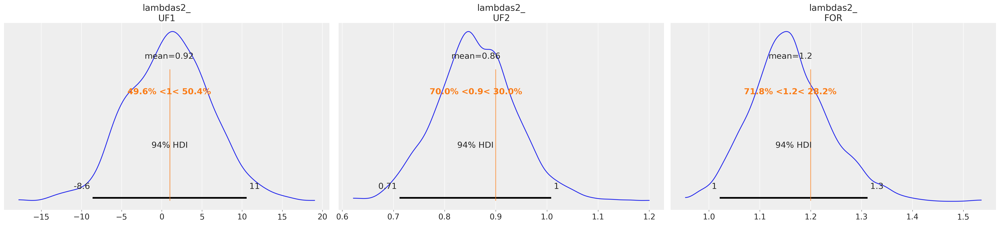

In [44]:
az.plot_posterior(idata, var_names=["lambdas2_"], ref_val=[1, 0.9, 1.2]);

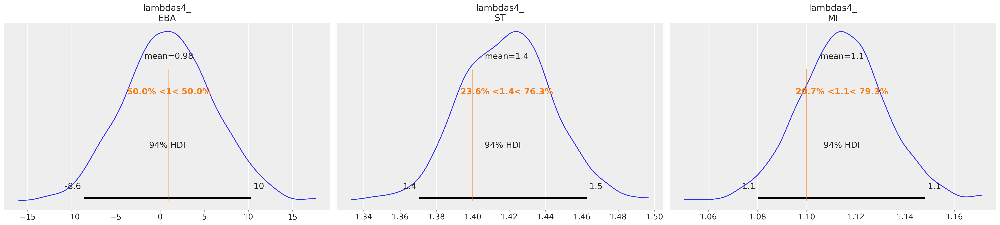

In [45]:
az.plot_posterior(idata, var_names=["lambdas4_"], ref_val=[1, 1.4, 1.1]);

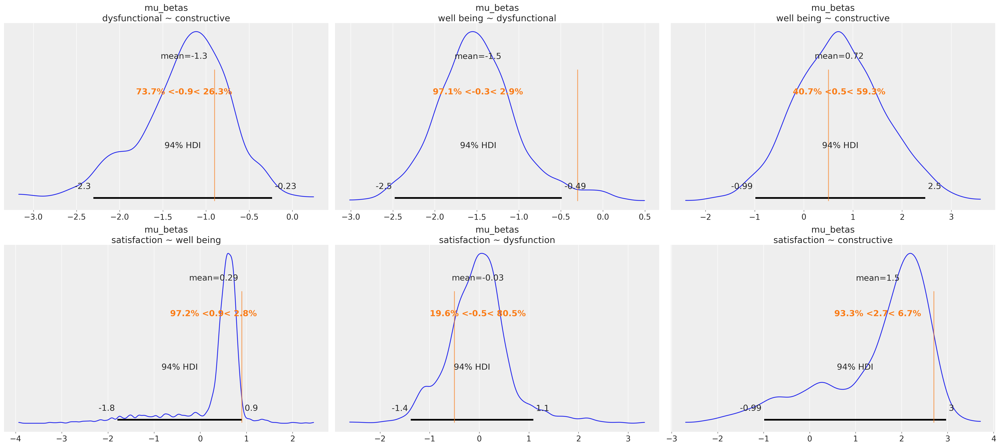

In [46]:
az.plot_posterior(idata, var_names=["mu_betas"], ref_val=[-0.9, -0.3, 0.5, 0.9, -0.5, 2.7]);

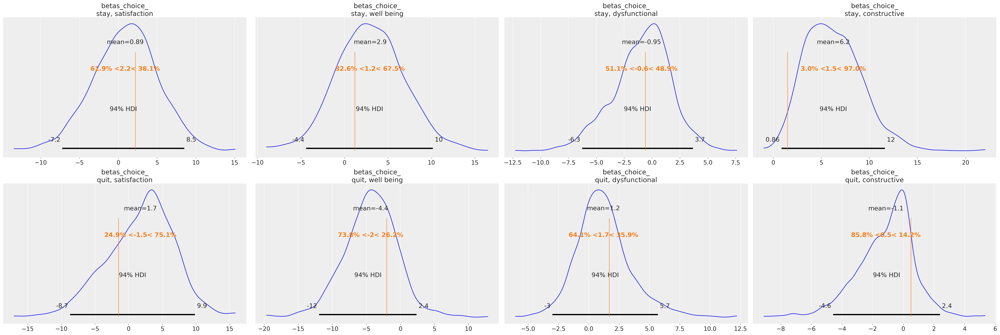

In [47]:
az.plot_posterior(
    idata,
    var_names=["betas_choice_"],
    ref_val=[2.2, 1.2, -0.6, 1.5, -1.5, -2, 1.7, 0.5, -0.5, 2.5, -1.5, 1.7],
    coords={"alts": ["stay", "quit"]},
);

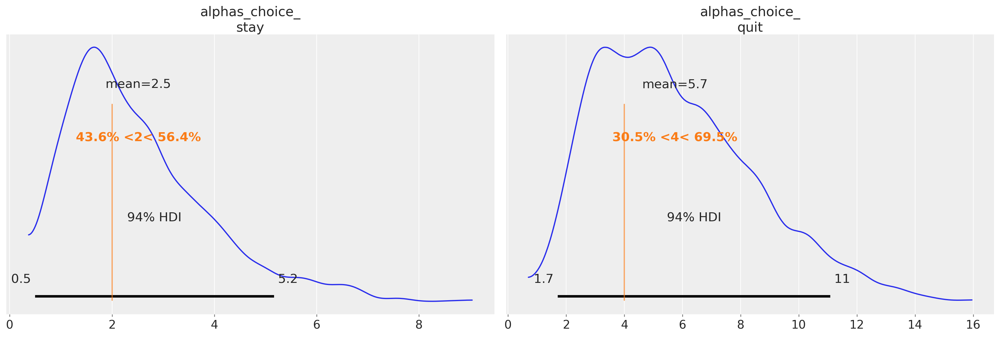

In [48]:
az.plot_posterior(
    idata, var_names=["alphas_choice_"], ref_val=[2, 4, 1], coords={"alts": ["stay", "quit"]}
);

## Latent Factors and Observed Outcomes

![](dcm_sem.png)

## Authors
- Authored by [Nathaniel Forde](https://nathanielf.github.io/) in November 2025 

## References
:::{bibliography}
:filter: docname in docnames
:::

## Watermark

In [49]:
%load_ext watermark
%watermark -n -u -v -iv -w -p pytensor

Last updated: Wed Oct 01 2025

Python implementation: CPython
Python version       : 3.10.15
IPython version      : 8.32.0

pytensor: 2.25.5

numpy     : 1.26.4
seaborn   : 0.13.2
pymc      : 5.17.0
arviz     : 0.20.0
pytensor  : 2.25.5
pandas    : 2.3.2
matplotlib: 3.9.2

Watermark: 2.5.0



:::{include} ../page_footer.md
:::